# Análise Exploratória do Dataset

Objetivo: levantar estatísticas do dataset ANTES de treinar qualquer modelo,
para justificar decisões de pré-processamento (crop, resize, FFT) com dados
concretos em vez de suposições.

In [15]:
import os
import random
import hashlib
from collections import defaultdict

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import face_recognition
import imagehash

from scipy.stats import mannwhitneyu

# Configuração

In [5]:
CAMINHO_DATASET = "/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset"
CLASSES = ["fake", "real"]
PASTA_SAIDA = "./eda_resultados"

os.makedirs(PASTA_SAIDA, exist_ok=True)
random.seed(42)

def listar_imagens(caminho_classe):
    extensoes = (".jpg", ".jpeg", ".png", ".bmp", ".webp")
    return [
        os.path.join(caminho_classe, f)
        for f in os.listdir(caminho_classe)
        if f.lower().endswith(extensoes)
    ]

print("Setup concluído.")

Setup concluído.


In [6]:
# ## 1) Integridade e balanceamento
#
# **Por quê:** antes de qualquer análise mais sofisticada, é preciso garantir
# que o dataset está íntegro (sem arquivos corrompidos) e que as classes
# estão de fato balanceadas como esperado (5000 falsas / 5000 reais). Um
# desbalanceamento não detectado invalida a interpretação de acurácia mais
# adiante, e um arquivo corrompido pode interromper um treino depois de
# horas rodando.

# %%
resumo_integridade = {}

for classe in CLASSES:
    caminho_classe = os.path.join(CAMINHO_DATASET, classe)
    arquivos = listar_imagens(caminho_classe)

    corrompidas = []
    for caminho in arquivos:
        try:
            with Image.open(caminho) as img:
                img.verify()
        except Exception:
            corrompidas.append(caminho)

    resumo_integridade[classe] = {
        "total": len(arquivos),
        "corrompidas": len(corrompidas),
        "arquivos_corrompidos": corrompidas,
    }

    print(f"Classe '{classe}': {len(arquivos)} imagens, {len(corrompidas)} corrompidas")
    if corrompidas:
        print(f"  -> Exemplos corrompidos: {corrompidas[:5]}")

Classe 'fake': 8000 imagens, 0 corrompidas
Classe 'real': 8000 imagens, 0 corrompidas


In [7]:
# ## 2) Duplicatas / near-duplicates
#
# **Por quê:** datasets sintéticos costumam ter imagens muito parecidas
# (mesma seed, pequena variação de geração). Se duplicatas caírem em treino
# **e** teste/validação ao mesmo tempo, a métrica final fica artificialmente
# inflada — o modelo "decora" a imagem em vez de aprender o padrão geral
# (vazamento de dados / *data leakage*). Isso é um dos erros mais comuns e
# mais graves em datasets desse tipo, e passa despercebido se não for
# checado explicitamente.
#
# Usamos *perceptual hash* (`phash`), que identifica imagens visualmente
# semelhantes mesmo com pequenas variações — diferente de um hash
# criptográfico, que só pega duplicatas byte-a-byte idênticas.

# %%
hashes = defaultdict(list)

for classe in CLASSES:
    caminho_classe = os.path.join(CAMINHO_DATASET, classe)
    for caminho in listar_imagens(caminho_classe):
        try:
            with Image.open(caminho) as img:
                h = imagehash.phash(img)
                hashes[h].append(caminho)
        except Exception:
            continue

duplicatas_exatas = {h: caminhos for h, caminhos in hashes.items() if len(caminhos) > 1}
total_imagens_duplicadas = sum(len(v) for v in duplicatas_exatas.values())

print(f"Grupos de duplicatas (mesmo phash): {len(duplicatas_exatas)}")
print(f"Total de imagens envolvidas: {total_imagens_duplicadas}")

if duplicatas_exatas:
    exemplo = list(duplicatas_exatas.items())[0]
    print(f"Exemplo de grupo duplicado: {exemplo[1][:3]}")

Grupos de duplicatas (mesmo phash): 0
Total de imagens envolvidas: 0


       largura                                                       altura  \
         count    mean  std     min     25%     50%     75%     max   count   
classe                                                                        
fake    8000.0  1024.0  0.0  1024.0  1024.0  1024.0  1024.0  1024.0  8000.0   
real    8000.0  1024.0  0.0  1024.0  1024.0  1024.0  1024.0  1024.0  8000.0   

                ...                 proporcao                                \
          mean  ...     75%     max     count mean  std  min  25%  50%  75%   
classe          ...                                                           
fake    1024.0  ...  1024.0  1024.0    8000.0  1.0  0.0  1.0  1.0  1.0  1.0   
real    1024.0  ...  1024.0  1024.0    8000.0  1.0  0.0  1.0  1.0  1.0  1.0   

             
        max  
classe       
fake    1.0  
real    1.0  

[2 rows x 24 columns]

Formatos por classe:
classe  formato
fake    JPEG       8000
real    JPEG       8000
dtype: int64


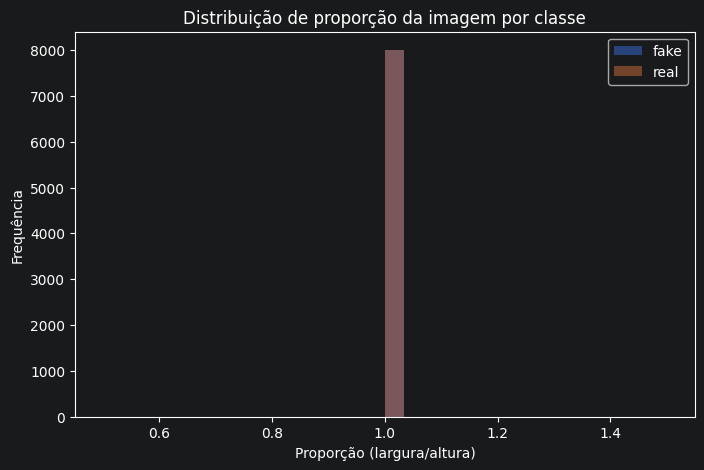

In [8]:
# ## 3) Resolução e formato original por classe
#
# **Por quê:** se as imagens reais e sintéticas vierem de fontes diferentes,
# pode haver diferença sistemática de resolução, proporção ou formato de
# arquivo entre as classes. Isso é perigoso porque o modelo pode aprender a
# distinguir "classe A vs B" usando esse atalho espúrio (ex: metadado de
# compressão, proporção característica) em vez do padrão visual real que
# queremos detectar — o que infla a métrica no dataset mas não generaliza
# para produção.

# %%
registros_resolucao = []

for classe in CLASSES:
    caminho_classe = os.path.join(CAMINHO_DATASET, classe)
    for caminho in listar_imagens(caminho_classe):
        try:
            with Image.open(caminho) as img:
                largura, altura = img.size
                registros_resolucao.append({
                    "classe": classe,
                    "largura": largura,
                    "altura": altura,
                    "proporcao": largura / altura,
                    "formato": img.format,
                    "modo": img.mode,
                })
        except Exception:
            continue

df_resolucao = pd.DataFrame(registros_resolucao)

print(df_resolucao.groupby("classe")[["largura", "altura", "proporcao"]].describe())
print("\nFormatos por classe:")
print(df_resolucao.groupby(["classe", "formato"]).size())

plt.figure(figsize=(8, 5))
for classe in CLASSES:
    subset = df_resolucao[df_resolucao["classe"] == classe]
    plt.hist(subset["proporcao"], bins=30, alpha=0.5, label=classe)
plt.xlabel("Proporção (largura/altura)")
plt.ylabel("Frequência")
plt.title("Distribuição de proporção da imagem por classe")
plt.legend()
plt.show()

Taxa de detecção de rosto: 99.73%
Imagens sem rosto detectado: 43
Exemplos: ['/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/fake/699_sd_14.jpg', '/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/real/878_celebhq.jpg', '/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/real/394_celebhq.jpg', '/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/real/2396_ffhq.jpg', '/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/real/1568_celebhq.jpg']

Deslocamento médio X: 0.024 (0=centro, 1=borda)
Deslocamento médio Y: 0.205
Proporção média da área do rosto: 0.324
Imagens com mais de 1 rosto detectado: 141


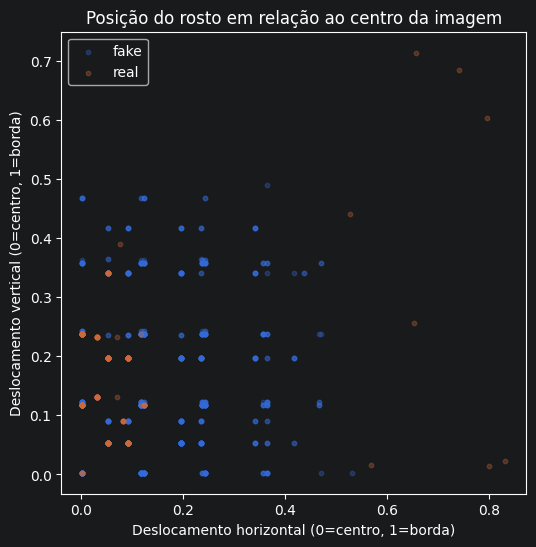

In [9]:
# ## 4) Posição e escala do rosto no frame
#
# **Por quê:** essa é a análise que responde, com números, a algo que só
# tínhamos observado visualmente numa imagem de exemplo (rosto fora do
# centro). Aqui quantificamos sistematicamente se os rostos do dataset
# estão centralizados e em escala comparável, ou se há variação relevante
# de enquadramento entre as imagens.
#
# O resultado desta seção justifica (ou descarta) formalmente a necessidade
# de um `crop_rosto` no pipeline de pré-processamento — com evidência
# quantitativa, não apenas impressão visual.
#
# > **Nota:** roda sobre o dataset inteiro por padrão (`AMOSTRA_POR_CLASSE =
# > None`), o que pode demorar, já que o detector de rosto não é o mais
# > rápido. Para uma primeira passada rápida, defina um número (ex: 500).

# %%
AMOSTRA_POR_CLASSE = None  # None = dataset inteiro

registros_posicao = []
sem_deteccao = []

for classe in CLASSES:
    caminho_classe = os.path.join(CAMINHO_DATASET, classe)
    arquivos = listar_imagens(caminho_classe)

    if AMOSTRA_POR_CLASSE:
        arquivos = random.sample(arquivos, min(AMOSTRA_POR_CLASSE, len(arquivos)))

    for caminho in arquivos:
        try:
            imagem_np = face_recognition.load_image_file(caminho)
            altura_img, largura_img = imagem_np.shape[:2]

            localizacoes = face_recognition.face_locations(imagem_np)

            if not localizacoes:
                sem_deteccao.append(caminho)
                continue

            top, right, bottom, left = localizacoes[0]

            centro_rosto_x = (left + right) / 2
            centro_rosto_y = (top + bottom) / 2
            centro_img_x = largura_img / 2
            centro_img_y = altura_img / 2

            deslocamento_x = abs(centro_rosto_x - centro_img_x) / (largura_img / 2)
            deslocamento_y = abs(centro_rosto_y - centro_img_y) / (altura_img / 2)

            area_rosto = (right - left) * (bottom - top)
            area_imagem = largura_img * altura_img
            proporcao_area = area_rosto / area_imagem

            registros_posicao.append({
                "classe": classe,
                "caminho": caminho,
                "deslocamento_x": deslocamento_x,
                "deslocamento_y": deslocamento_y,
                "proporcao_area_rosto": proporcao_area,
                "n_rostos_detectados": len(localizacoes),
            })

        except Exception:
            sem_deteccao.append(caminho)

df_posicao = pd.DataFrame(registros_posicao)

taxa_deteccao = len(registros_posicao) / (len(registros_posicao) + len(sem_deteccao)) * 100
print(f"Taxa de detecção de rosto: {taxa_deteccao:.2f}%")
print(f"Imagens sem rosto detectado: {len(sem_deteccao)}")
if sem_deteccao:
    print(f"Exemplos: {sem_deteccao[:5]}")

print(f"\nDeslocamento médio X: {df_posicao['deslocamento_x'].mean():.3f} (0=centro, 1=borda)")
print(f"Deslocamento médio Y: {df_posicao['deslocamento_y'].mean():.3f}")
print(f"Proporção média da área do rosto: {df_posicao['proporcao_area_rosto'].mean():.3f}")

multiplos_rostos = (df_posicao["n_rostos_detectados"] > 1).sum()
print(f"Imagens com mais de 1 rosto detectado: {multiplos_rostos}")

plt.figure(figsize=(6, 6))
for classe in CLASSES:
    subset = df_posicao[df_posicao["classe"] == classe]
    plt.scatter(subset["deslocamento_x"], subset["deslocamento_y"], alpha=0.3, s=10, label=classe)
plt.xlabel("Deslocamento horizontal (0=centro, 1=borda)")
plt.ylabel("Deslocamento vertical (0=centro, 1=borda)")
plt.title("Posição do rosto em relação ao centro da imagem")
plt.legend()
plt.show()

Total sem detecção: 43

/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/fake/699_sd_14.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/real/878_celebhq.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/real/394_celebhq.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/real/2396_ffhq.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/real/1568_celebhq.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/real/4992_ffhq.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/real/1252_celebhq.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/real/3909_ffhq.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/real/345_ffhq.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/real/4508_ffhq.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/real/47

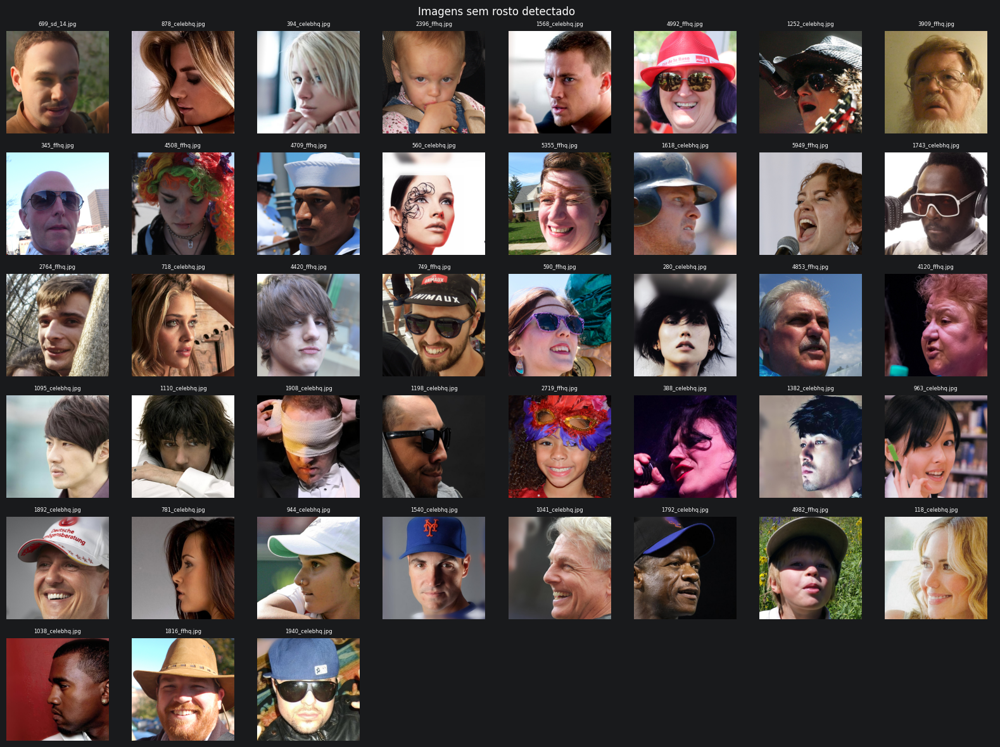

Total com múltiplos rostos: 141

/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/fake/930_stylegan2.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/fake/968_stylegan3.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/fake/700_stylegan2.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/fake/1380_stylegan3.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/fake/1793_sd_14.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/fake/417_stylegan2.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/fake/389_stylegan2.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/fake/1322_stylegan3.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/fake/1369_sd_21.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/fake/1293_stylegan3.jpg
/home/guilhermemathiasreis/Documents/syn

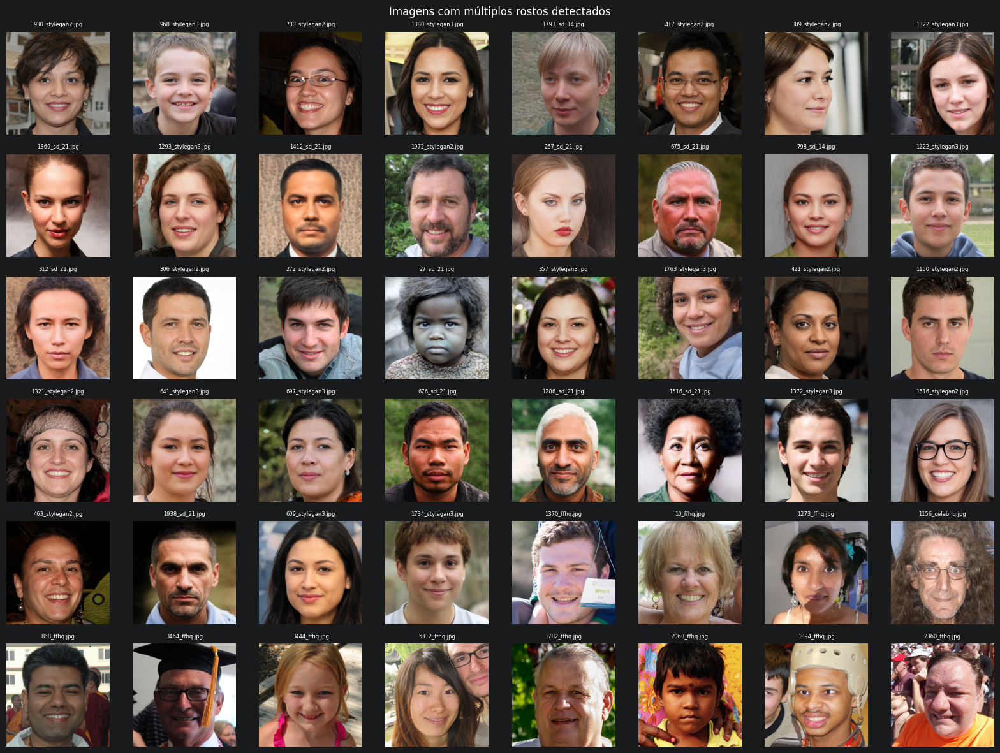

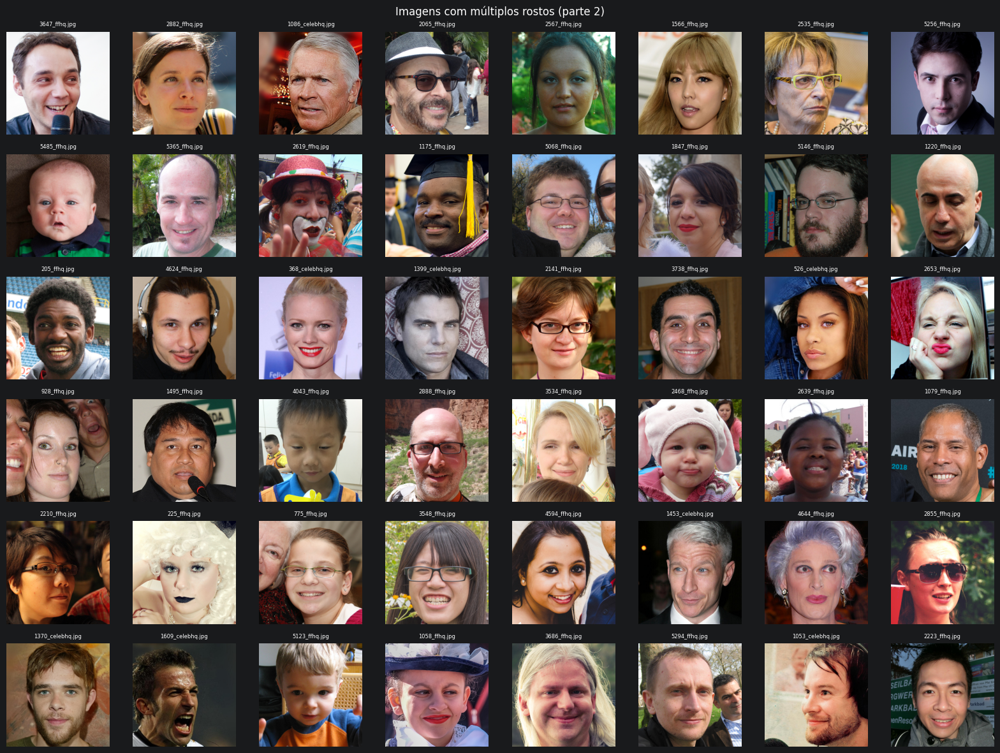

In [11]:
 ## 4.1) Inspeção detalhada: imagens sem detecção e com múltiplos rostos
#
# Continuação do bloco 4 (posição do rosto). Aqui listamos **todos** os
# nomes de arquivo das imagens sem detecção e com múltiplos rostos — não
# apenas os exemplos truncados do print anterior — e geramos um grid visual
# das imagens com múltiplos rostos para confirmar o padrão observado
# (ex: selfies em dupla) antes de decidir o tratamento de cada caso.
#
# Depende das variáveis já criadas no bloco 4: `df_posicao`, `sem_deteccao`,
# `CAMINHO_DATASET`, `CLASSES`.

# %%
import math

# --------------------------------------------------------------
# Lista completa das imagens SEM detecção de rosto
# --------------------------------------------------------------
print(f"Total sem detecção: {len(sem_deteccao)}\n")
for caminho in sem_deteccao:
    print(caminho)

# salva em arquivo texto para anexar/registrar na metodologia do TCC
with open(f"{PASTA_SAIDA}/imagens_sem_deteccao.txt", "w") as f:
    f.write("\n".join(sem_deteccao))

# %% [markdown]
# ### Grid visual das imagens sem detecção
#
# Inspeção visual rápida — confirma se são casos legítimos (rosto de
# perfil extremo, muito escuro, oclusão) ou possível falha/bug no arquivo.

# %%
def mostrar_grid(caminhos, titulo, max_imagens=48, colunas=8):
    caminhos = caminhos[:max_imagens]
    linhas = math.ceil(len(caminhos) / colunas)

    fig, axes = plt.subplots(linhas, colunas, figsize=(colunas * 2, linhas * 2))
    axes = axes.flatten() if len(caminhos) > 1 else [axes]

    for i, caminho in enumerate(caminhos):
        try:
            with Image.open(caminho) as img:
                axes[i].imshow(img)
        except Exception:
            axes[i].text(0.5, 0.5, "erro ao abrir", ha="center", va="center")
        axes[i].set_title(os.path.basename(caminho), fontsize=6)
        axes[i].axis("off")

    for j in range(len(caminhos), len(axes)):
        axes[j].axis("off")

    fig.suptitle(titulo)
    plt.tight_layout()
    plt.show()


mostrar_grid(sem_deteccao, "Imagens sem rosto detectado", max_imagens=48)

# %% [markdown]
# ### Lista completa das imagens com MÚLTIPLOS rostos detectados

# %%
caminhos_multiplos_rostos = df_posicao[
    df_posicao["n_rostos_detectados"] > 1
]["caminho"].tolist()

print(f"Total com múltiplos rostos: {len(caminhos_multiplos_rostos)}\n")
for caminho in caminhos_multiplos_rostos:
    print(caminho)

with open(f"{PASTA_SAIDA}/imagens_multiplos_rostos.txt", "w") as f:
    f.write("\n".join(caminhos_multiplos_rostos))

# %% [markdown]
# ### Grid visual das imagens com múltiplos rostos
#
# Confirma se o padrão dominante é o observado (ex: selfie em dupla, rosto
# principal maior e centralizado + rosto secundário menor/cortado na borda)
# ou se há outros casos (falso positivo do detector, pessoa genuinamente
# ao fundo) que exigiriam tratamento diferente do critério de "maior área".

# %%
mostrar_grid(caminhos_multiplos_rostos, "Imagens com múltiplos rostos detectados", max_imagens=48)

# %% [markdown]
# Se quiser inspecionar em blocos (já que são 141 imagens e o grid mostra só
# as primeiras 48 por padrão), rode a célula abaixo trocando o slice
# `[48:96]`, `[96:141]` etc.

# %%
mostrar_grid(caminhos_multiplos_rostos[48:96], "Imagens com múltiplos rostos (parte 2)", max_imagens=48)

Total reprocessado: 141
Eram falso positivo (duplicata do detector, na verdade 1 rosto): 0
Continuam com múltiplos rostos distintos após correção: 141
Total: 141

/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/fake/930_stylegan2.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/fake/968_stylegan3.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/fake/700_stylegan2.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/fake/1380_stylegan3.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/fake/1793_sd_14.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/fake/417_stylegan2.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/fake/389_stylegan2.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/fake/1322_stylegan3.jpg
/home/guilhermemathiasreis/Documents/synthetic-face-detection/dataset/fake/1369_sd_21.jpg
/hom

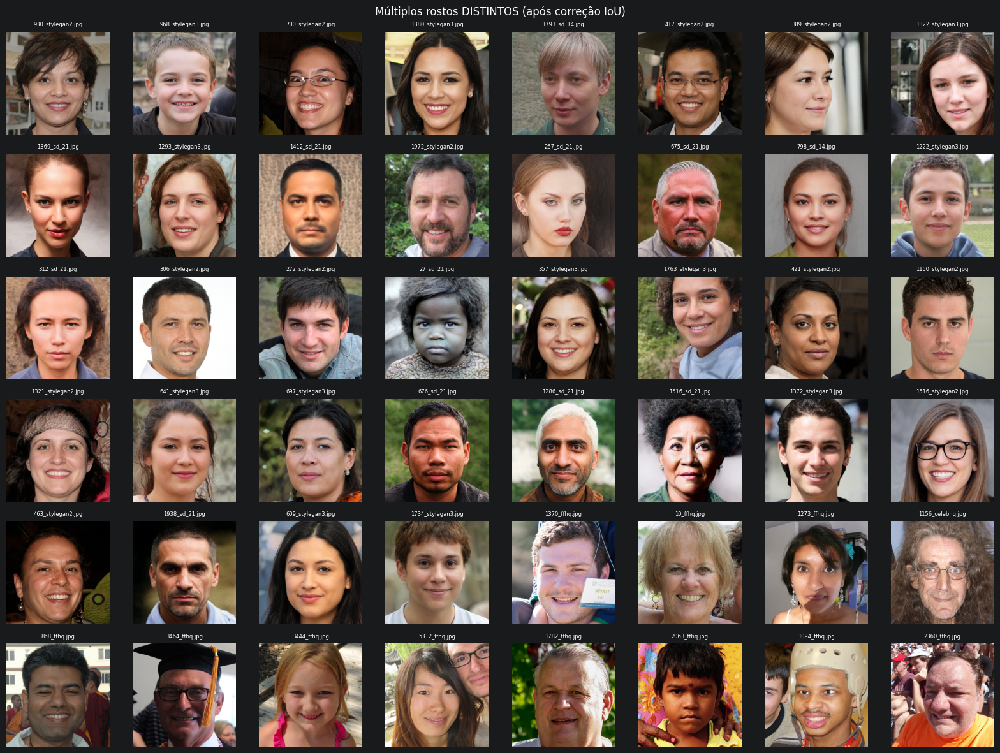

In [12]:
# %% [markdown]
# ## 4.2) Diagnóstico: "múltiplos rostos" são reais ou falso positivo do detector?
#
# As imagens inspecionadas visualmente no bloco anterior mostraram, em sua
# maioria, retratos de rosto único (FFHQ, CelebA-HQ, StyleGAN) — não selfies
# em dupla. Isso indica que boa parte das 141 detecções de "múltiplos
# rostos" é **falso positivo do detector HOG**: a mesma pessoa detectada
# duas vezes (caixas sobrepostas), ou acessórios/texturas confundidos com
# um segundo rosto.
#
# Aqui usamos IoU (Intersection over Union) para diferenciar:
# - **IoU alto entre duas caixas** → mesma pessoa detectada 2x (falso positivo
#   de duplicação) → deve ser tratado como 1 rosto único.
# - **IoU baixo/zero** → caixas realmente distintas → pode ser um segundo
#   rosto genuíno (ex: selfie em dupla) ou um falso positivo em
#   acessório/textura, e precisa de inspeção manual.

# %%
def calcular_iou(caixa_a, caixa_b):
    """caixa no formato (top, right, bottom, left), como retornado por face_recognition"""
    top_a, right_a, bottom_a, left_a = caixa_a
    top_b, right_b, bottom_b, left_b = caixa_b

    left_inter = max(left_a, left_b)
    top_inter = max(top_a, top_b)
    right_inter = min(right_a, right_b)
    bottom_inter = min(bottom_a, bottom_b)

    if right_inter <= left_inter or bottom_inter <= top_inter:
        return 0.0

    area_inter = (right_inter - left_inter) * (bottom_inter - top_inter)
    area_a = (right_a - left_a) * (bottom_a - top_a)
    area_b = (right_b - left_b) * (bottom_b - top_b)

    return area_inter / (area_a + area_b - area_inter)


def contar_rostos_distintos(localizacoes, limiar_iou=0.3):
    """Agrupa caixas sobrepostas (mesmo rosto detectado 2x) e retorna a
    contagem de rostos realmente distintos, junto com as caixas resultantes
    (a de maior área de cada grupo)."""
    if len(localizacoes) <= 1:
        return localizacoes

    usadas = [False] * len(localizacoes)
    grupos = []

    for i in range(len(localizacoes)):
        if usadas[i]:
            continue
        grupo = [i]
        usadas[i] = True
        for j in range(i + 1, len(localizacoes)):
            if usadas[j]:
                continue
            if calcular_iou(localizacoes[i], localizacoes[j]) >= limiar_iou:
                grupo.append(j)
                usadas[j] = True
        grupos.append(grupo)

    # de cada grupo, mantém a caixa de maior área como representante
    caixas_representantes = []
    for grupo in grupos:
        caixas_do_grupo = [localizacoes[k] for k in grupo]
        areas = [(b - t) * (r - l) for t, r, b, l in caixas_do_grupo]
        caixas_representantes.append(caixas_do_grupo[areas.index(max(areas))])

    return caixas_representantes


# %% [markdown]
# ### Reprocessa as 141 imagens aplicando a correção de IoU
#
# Reexecuta a detecção nessas imagens especificamente, agora agrupando
# detecções sobrepostas antes de contar quantos rostos distintos existem.

# %%
registros_corrigidos = []

for caminho in caminhos_multiplos_rostos:
    try:
        imagem_np = face_recognition.load_image_file(caminho)
        localizacoes = face_recognition.face_locations(imagem_np)

        caixas_distintas = contar_rostos_distintos(localizacoes, limiar_iou=0.3)

        registros_corrigidos.append({
            "caminho": caminho,
            "n_deteccoes_brutas": len(localizacoes),
            "n_rostos_distintos_corrigido": len(caixas_distintas),
        })
    except Exception:
        continue

df_correcao = pd.DataFrame(registros_corrigidos)

n_eram_duplicata = (df_correcao["n_rostos_distintos_corrigido"] == 1).sum()
n_realmente_multiplos = (df_correcao["n_rostos_distintos_corrigido"] > 1).sum()

print(f"Total reprocessado: {len(df_correcao)}")
print(f"Eram falso positivo (duplicata do detector, na verdade 1 rosto): {n_eram_duplicata}")
print(f"Continuam com múltiplos rostos distintos após correção: {n_realmente_multiplos}")

# %% [markdown]
# ### Lista dos casos que continuam com múltiplos rostos DISTINTOS
#
# Só essa lista final precisa de inspeção manual (provavelmente selfies em
# dupla de verdade, como o exemplo confirmado anteriormente). O restante
# das 141 era duplicata de detecção do mesmo rosto e será tratado como
# imagem de rosto único.

# %%
caminhos_realmente_multiplos = df_correcao[
    df_correcao["n_rostos_distintos_corrigido"] > 1
]["caminho"].tolist()

print(f"Total: {len(caminhos_realmente_multiplos)}\n")
for caminho in caminhos_realmente_multiplos:
    print(caminho)

if caminhos_realmente_multiplos:
    mostrar_grid(caminhos_realmente_multiplos, "Múltiplos rostos DISTINTOS (após correção IoU)", max_imagens=48)

       brilho_medio                                                           \
              count        mean        std        min        25%         50%   
classe                                                                         
fake          500.0  110.692566  22.228352  47.163570  96.512453  110.726345   
real          500.0  113.817299  29.531824  43.166161  93.349100  112.846413   

                               contraste_std                                   \
               75%         max         count       mean        std        min   
classe                                                                          
fake    125.632111  186.005127         500.0  52.970032  11.386351  21.739201   
real    132.526932  203.546295         500.0  59.466797  10.943754  30.617258   

                                                    
              25%        50%        75%        max  
classe                                              
fake    45.847803  52.719273  60.4

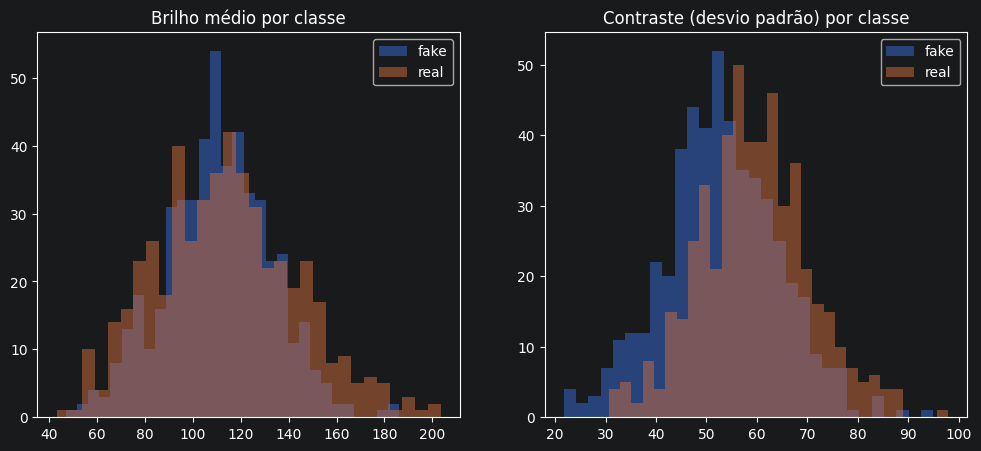

In [10]:
# ## 5) Brilho e contraste por classe
#
# **Por quê:** outro atalho espúrio clássico em detecção de imagem
# sintética. Se as imagens sintéticas tenderem a ser sistematicamente mais
# "lisas" ou uniformes em brilho/contraste do que as reais, o modelo pode
# aprender esse padrão simples em vez dos artefatos de geração que de fato
# nos interessam. É um ponto que costuma ser questionado em bancas —
# barato de calcular e de reportar.

# %%
AMOSTRA_BRILHO = 500

registros_brilho = []

for classe in CLASSES:
    caminho_classe = os.path.join(CAMINHO_DATASET, classe)
    arquivos = listar_imagens(caminho_classe)
    arquivos = random.sample(arquivos, min(AMOSTRA_BRILHO, len(arquivos)))

    for caminho in arquivos:
        try:
            with Image.open(caminho) as img:
                img_gray = np.array(img.convert("L"), dtype=np.float32)
                registros_brilho.append({
                    "classe": classe,
                    "brilho_medio": img_gray.mean(),
                    "contraste_std": img_gray.std(),
                })
        except Exception:
            continue

df_brilho = pd.DataFrame(registros_brilho)
print(df_brilho.groupby("classe")[["brilho_medio", "contraste_std"]].describe())

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
for classe in CLASSES:
    subset = df_brilho[df_brilho["classe"] == classe]
    axes[0].hist(subset["brilho_medio"], bins=30, alpha=0.5, label=classe)
    axes[1].hist(subset["contraste_std"], bins=30, alpha=0.5, label=classe)
axes[0].set_title("Brilho médio por classe")
axes[0].legend()
axes[1].set_title("Contraste (desvio padrão) por classe")
axes[1].legend()
plt.show()

Processando fake...
Processando real...


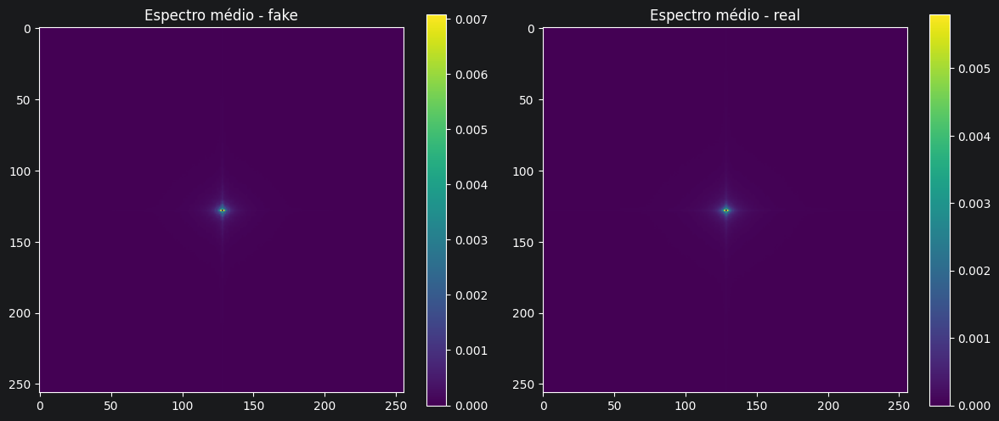

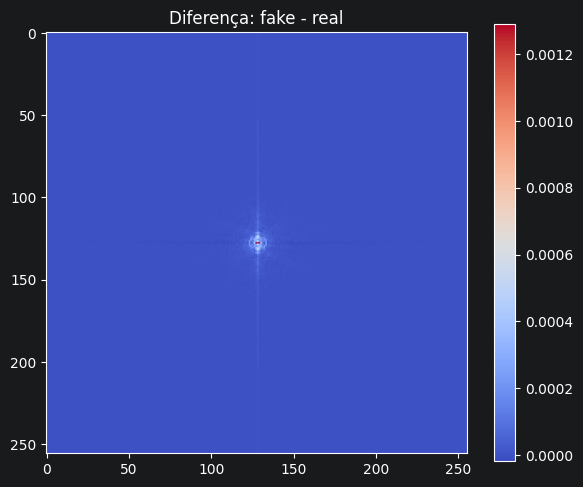

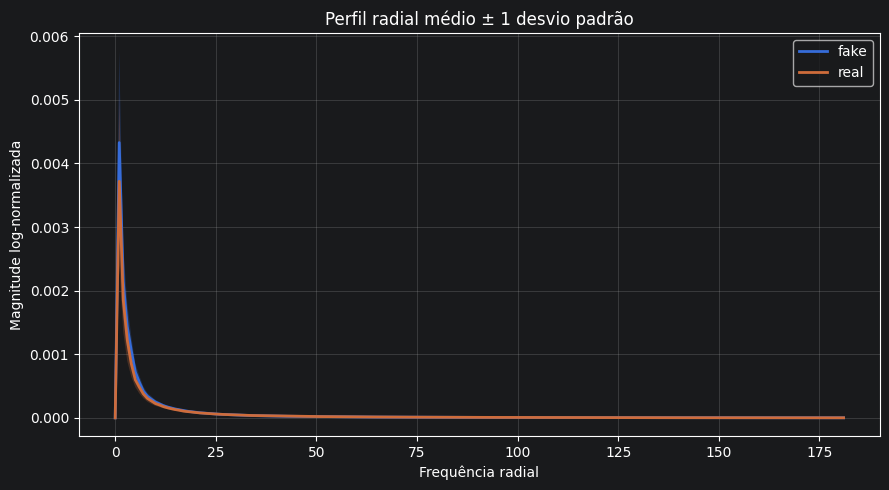

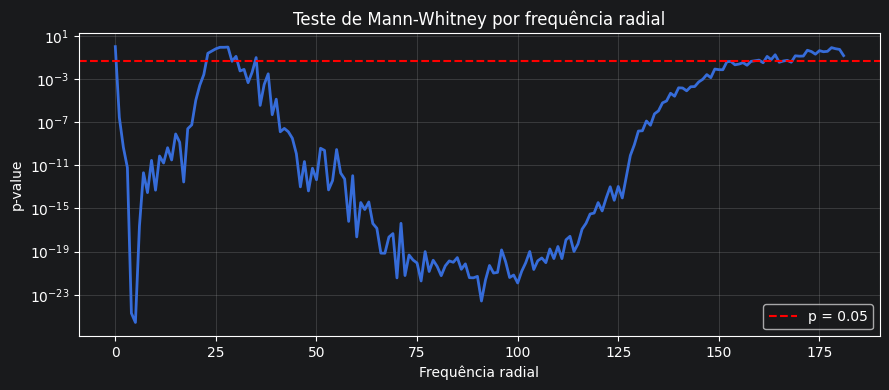

Total de frequências analisadas: 182
Frequências com diferença significativa: 155
Primeiras frequências significativas:
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]


In [16]:
AMOSTRA_FFT = 300
TAMANHO_RESIZE = 256

# -----------------------------------------------------------------------------
# Perfil radial
# -----------------------------------------------------------------------------

def perfil_radial(espectro):

    y, x = np.indices(espectro.shape)

    centro = (
        espectro.shape[0] / 2,
        espectro.shape[1] / 2
    )

    r = np.sqrt(
        (x - centro[1])**2 +
        (y - centro[0])**2
    ).astype(np.int32)

    soma = np.bincount(r.ravel(), espectro.ravel())
    contagem = np.bincount(r.ravel())

    return soma / contagem


# -----------------------------------------------------------------------------
# Estruturas
# -----------------------------------------------------------------------------

espectros = {classe: [] for classe in CLASSES}
perfis = {classe: [] for classe in CLASSES}

# -----------------------------------------------------------------------------
# FFT de todas as imagens
# -----------------------------------------------------------------------------

for classe in CLASSES:

    print(f"Processando {classe}...")

    pasta = os.path.join(CAMINHO_DATASET, classe)

    arquivos = listar_imagens(pasta)

    arquivos = random.sample(
        arquivos,
        min(AMOSTRA_FFT, len(arquivos))
    )

    for caminho in arquivos:

        try:

            with Image.open(caminho) as img:

                img = img.convert("L")
                img = img.resize((TAMANHO_RESIZE, TAMANHO_RESIZE))

                img = np.array(img, dtype=np.float32)

                # remove componente DC
                img -= img.mean()

                fft = np.fft.fft2(img)
                fft = np.fft.fftshift(fft)

                magnitude = np.abs(fft)

                # normaliza energia
                magnitude /= (magnitude.sum() + 1e-8)

                magnitude = np.log1p(magnitude)

                espectros[classe].append(magnitude)

                perfis[classe].append(
                    perfil_radial(magnitude)
                )

        except Exception:
            pass


# -----------------------------------------------------------------------------
# Espectro médio
# -----------------------------------------------------------------------------

espectro_medio = {}

for classe in CLASSES:
    espectro_medio[classe] = np.mean(espectros[classe], axis=0)

# -----------------------------------------------------------------------------
# Plot espectro médio
# -----------------------------------------------------------------------------

fig, axes = plt.subplots(
    1,
    len(CLASSES),
    figsize=(6 * len(CLASSES), 5)
)

if len(CLASSES) == 1:
    axes = [axes]

for i, classe in enumerate(CLASSES):

    im = axes[i].imshow(
        espectro_medio[classe],
        cmap="viridis"
    )

    axes[i].set_title(f"Espectro médio - {classe}")

    plt.colorbar(im, ax=axes[i])

plt.tight_layout()
plt.show()

# -----------------------------------------------------------------------------
# Diferença entre espectros
# -----------------------------------------------------------------------------

if len(CLASSES) == 2:

    diferenca = (
        espectro_medio[CLASSES[0]]
        -
        espectro_medio[CLASSES[1]]
    )

    plt.figure(figsize=(6,5))

    plt.imshow(
        diferenca,
        cmap="coolwarm"
    )

    plt.colorbar()

    plt.title(
        f"Diferença: {CLASSES[0]} - {CLASSES[1]}"
    )

    plt.tight_layout()

    plt.show()

# -----------------------------------------------------------------------------
# Perfil radial médio
# -----------------------------------------------------------------------------

plt.figure(figsize=(9,5))

for classe in CLASSES:

    perfis_classe = np.array(perfis[classe])

    media = perfis_classe.mean(axis=0)

    desvio = perfis_classe.std(axis=0)

    x = np.arange(len(media))

    plt.plot(
        x,
        media,
        linewidth=2,
        label=classe
    )

    plt.fill_between(
        x,
        media - desvio,
        media + desvio,
        alpha=0.25
    )

plt.xlabel("Frequência radial")
plt.ylabel("Magnitude log-normalizada")
plt.title("Perfil radial médio ± 1 desvio padrão")

plt.legend()

plt.grid(alpha=0.3)

plt.tight_layout()

plt.show()

# -----------------------------------------------------------------------------
# Teste estatístico
# -----------------------------------------------------------------------------

if len(CLASSES) == 2:

    dados1 = np.array(perfis[CLASSES[0]])
    dados2 = np.array(perfis[CLASSES[1]])

    pvalues = []

    for i in range(dados1.shape[1]):

        _, p = mannwhitneyu(
            dados1[:, i],
            dados2[:, i],
            alternative="two-sided"
        )

        pvalues.append(p)

    pvalues = np.array(pvalues)

    plt.figure(figsize=(9,4))

    plt.plot(
        pvalues,
        linewidth=2
    )

    plt.axhline(
        0.05,
        color="red",
        linestyle="--",
        label="p = 0.05"
    )

    plt.yscale("log")

    plt.xlabel("Frequência radial")
    plt.ylabel("p-value")

    plt.title("Teste de Mann-Whitney por frequência radial")

    plt.legend()

    plt.grid(alpha=0.3)

    plt.tight_layout()

    plt.show()

    significativos = np.where(pvalues < 0.05)[0]

    print("=" * 60)
    print(f"Total de frequências analisadas: {len(pvalues)}")
    print(f"Frequências com diferença significativa: {len(significativos)}")

    if len(significativos) > 0:
        print("Primeiras frequências significativas:")
        print(significativos[:20])

    print("=" * 60)

In [ ]:
# ## Resumo final
#
# Consolida os principais números levantados nesta análise. Esses valores
# (taxa de detecção de rosto, deslocamento médio, presença de duplicatas)
# são justamente os dados que sustentam as decisões de pré-processamento
# tomadas na próxima etapa (crop de rosto, resolução escolhida, uso de FFT).

# %%
print("=== RESUMO DA ANÁLISE EXPLORATÓRIA ===")
print(f"Integridade: {resumo_integridade}")
print(f"Duplicatas encontradas: {len(duplicatas_exatas)} grupos, {total_imagens_duplicadas} imagens")
print(f"Taxa de detecção de rosto: {taxa_deteccao:.2f}%")
print(f"Deslocamento médio do rosto: X={df_posicao['deslocamento_x'].mean():.3f}, Y={df_posicao['deslocamento_y'].mean():.3f}")